In [1]:
import pandas as pd, numpy as np, os
import matplotlib.pyplot as plt
import matplotlib.backends.backend_pdf
from matplotlib.backends.backend_pdf import PdfPages

In [2]:
output_dir = '/mnt/share/costeffectiveness/results/vivarium_ciff_sam/v7.1.0_full_model_vicious_cyle_diarrhea_remission/ciff_sam/2022_03_08_00_15_24/count_data/'

In [3]:
pd.read_csv(output_dir + 'wasting_transition_count.csv').age.unique()

array(['early_neonatal', 'late_neonatal', '1-5_months', '6-11_months',
       '12_to_23_months', '2_to_4'], dtype=object)

In [16]:
scenarios = ['baseline',
             'sam_treatment',
             'mam_treatment',
             'sqlns',
             'lbwsg_interventions',
             'zinc_supplementation']
scenario_names = ['Baseline',
                 '+SAM treatment',
                 '+MAM treatment',
                 '+SQ-LNS',
                 '+LBWSG interventions',
                 '+Zinc supplementation']
scenario_colors = ['tab:blue',
                  'tab:orange',
                  'tab:green',
                  'tab:red',
                  'tab:purple',
                  'tab:brown']
scenario_order = pd.DataFrame()
scenario_order['scenario'] = scenarios
scenario_order['order'] = list(range(0,len(scenarios)))
scenario_order

,scenario,order
0,baseline,0
1,sam_treatment,1
2,mam_treatment,2
3,sqlns,3
4,lbwsg_interventions,4
5,zinc_supplementation,5


In [5]:
def calculate_wasting_values(output_dir, ages, strata_cols, measure, metric, 
                             relative_scenario):
    if measure=='prevalence':
        data = pd.read_csv(output_dir + 'wasting_state_person_time.csv').drop(columns=['Unnamed: 0'])
        wasted = data.loc[data.cause.str.contains('acute_malnutrition')]
        wasted['cause'] = 'wasted'
        wasted = (wasted.groupby([c for c in wasted.columns if c != 'value']).sum())
        data = pd.concat([data,wasted.reset_index()],ignore_index=True)
    elif measure=='incidence':
        data = (pd.read_csv(output_dir + 'wasting_transition_count.csv')
                .drop(columns=['Unnamed: 0']).rename(columns={'measure':'cause'}))
        wasted = data.loc[data.cause.isin(['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
                                          'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count'])]
        wasted['cause'] = 'wasted'
        total_mam = data.loc[data.cause.isin(['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
                                             'severe_acute_malnutrition_to_moderate_acute_malnutrition_event_count'])]
        total_mam['cause'] = 'total_mam'
        wasted = pd.concat([wasted,total_mam])
        wasted = (wasted.groupby([c for c in wasted.columns if c != 'value']).sum())
        data = pd.concat([data,wasted.reset_index()],ignore_index=True)
        pt = pd.read_csv(output_dir + 'wasting_state_person_time.csv').drop(columns=['Unnamed: 0'])
        groupby_cols = ['input_draw','scenario','cause']
    data = data.loc[data.age.isin(ages)]    
    data = data.groupby(['input_draw','scenario'] + strata_cols + ['cause']).sum()
    if measure=='prevalence':
        data = data / data.groupby(['input_draw','scenario'] + strata_cols).sum() * 100
    else:
        pt = pt.loc[pt.age.isin(ages)].groupby(['input_draw','scenario'] + strata_cols).sum()
        data = data / pt * 100_000     
    #if metric=='value':
    #    data = (data.groupby(['scenario','cause'] + strata_cols)
    #                .describe(percentiles=[0.025,0.975]))
    if metric != 'value':
        data_baseline = (data.reset_index().loc[data.reset_index().scenario==relative_scenario]
                   .set_index(['input_draw','cause'] + strata_cols)
                   .drop(columns='scenario'))
        if metric=='percent_reduction':
            data = ((data_baseline - data.reset_index().set_index(['input_draw','cause'] + strata_cols + ['scenario']))
                    / data_baseline) * 100
        elif metric=='absolute_reduction':
            data = data_baseline - data.reset_index().set_index(['input_draw','cause'] + strata_cols + ['scenario'])
            
        #data = (data.reset_index().groupby(['scenario','cause'] + strata_cols)
        #        .describe(percentiles=[0.025,0.975])).drop(columns='input_draw')
    data = data.reset_index().merge(scenario_order, on='scenario').sort_values(by='order')
    data = (data.groupby(['scenario','cause'] + strata_cols)
                    .describe(percentiles=[0.025,0.975]))[['value']]
    return data.reset_index()

In [24]:
def format_2026_table(measure, metric, relative_scenario):
    t = calculate_wasting_values(output_dir, ages, ['year'], measure, metric, relative_scenario)
    t = t.loc[(t.year==2026)]
    if measure=='incidence':
        t = t.loc[(t.cause.isin(['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
                            'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count',
                                'wasted']))]
    if measure=='prevalence' or metric == 'percent_reduction':
        t['result'] = (t['value','mean'].round(1).astype(str)
                  + ' ('
                  + t['value','2.5%'].round(1).astype(str)
                  + ' to '
                  + t['value','97.5%'].round(1).astype(str)
                  + ')')
    else:
        t['result'] = (t['value','mean'].round(0).astype(int).astype(str)
                  + ' ('
                  + t['value','2.5%'].round(0).astype(int).astype(str)
                  + ' to '
                  + t['value','97.5%'].round(0).astype(int).astype(str)
                  + ')')
    t = t.set_index(['scenario','cause']).unstack()[['result']].reset_index()
    t['scenario_order'] = np.where(t.scenario=='baseline',0,
                                  np.where(t.scenario=='sam_treatment',1,
                                          np.where(t.scenario=='mam_treatment',2,
                                                  np.where(t.scenario=='sqlns',3,
                                                          np.where(t.scenario=='lbwsg_interventions',4,5)))))
    t = t.sort_values(by='scenario_order').drop(columns='scenario_order')
    return t

In [7]:
six_to_59_ages = ['6-11_months',
       '12_to_23_months', '2_to_4']
ages = ['6-11_months',
       '12_to_23_months', '2_to_4']

## Finding 1: cross sectional prevalence

In [8]:
format_2026_table('prevalence', 'value', 'baseline')

/tmp/ipykernel_604473/1651436955.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'


scenario             result                              \
                                                                             
cause                       mild_child_wasting moderate_acute_malnutrition   
0                  baseline  19.2 (18.9, 19.6)              6.8 (6.6, 7.0)   
3             sam_treatment  19.5 (19.2, 19.9)              6.6 (6.5, 6.9)   
2             mam_treatment  20.0 (19.7, 20.6)              5.8 (5.6, 6.1)   
4                     sqlns  20.5 (20.0, 21.0)              5.1 (5.0, 5.2)   
1       lbwsg_interventions  20.5 (20.0, 21.0)              5.1 (4.9, 5.2)   
5      zinc_supplementation  20.1 (19.7, 20.5)              4.7 (4.6, 4.9)   

                                                                              
                                                                              
cause severe_acute_malnutrition susceptible_to_child_wasting          wasted  
0                1.6 (1.5, 1.7)            64.1 (63.6, 64.7)  8.4 (8.1, 8.6)  
3                1.3 (1.2, 1.4)            64.7 (64.1, 65.4)  7.9 (7.7, 8.2)  
2                1.2 (1.1, 1.3)            65.9 (65.2, 66.7)  7.0 (6.8, 7.4)  
4                1.1 (1.0, 1.2)            67.2 (66.7, 67.6)  6.2 (6.0, 6.3)  
1                1.1 (1.0, 1.2)            67.2 (66.8, 67.7)  6.2 (5.9, 6.3)  
5                1.0 (0.9, 1.1)            68.4 (68.0, 69.0)  5.7 (5.6, 5.9)

In [9]:
format_2026_table('prevalence', 'percent_reduction', 'baseline')

/tmp/ipykernel_604473/1651436955.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'


scenario             result                              \
                                                                             
cause                       mild_child_wasting moderate_acute_malnutrition   
0                  baseline     0.0 (0.0, 0.0)              0.0 (0.0, 0.0)   
3             sam_treatment  -1.4 (-2.0, -1.1)              2.5 (1.1, 4.6)   
2             mam_treatment  -4.4 (-5.3, -3.7)           14.0 (12.0, 17.0)   
4                     sqlns  -6.7 (-7.5, -5.2)           24.5 (21.6, 27.3)   
1       lbwsg_interventions  -6.7 (-7.5, -5.2)           24.7 (21.9, 27.5)   
5      zinc_supplementation  -4.6 (-6.0, -3.1)           30.0 (27.8, 32.4)   

                                                              \
                                                               
cause severe_acute_malnutrition susceptible_to_child_wasting   
0                0.0 (0.0, 0.0)               0.0 (0.0, 0.0)   
3             17.6 (13.1, 21.1)            -1.0 (-1.4, -0.7)   
2             25.2 (21.2, 29.0)            -2.9 (-3.5, -2.5)   
4             32.5 (27.8, 35.8)            -4.8 (-5.4, -4.2)   
1             33.0 (28.3, 36.3)            -4.8 (-5.4, -4.3)   
5             36.5 (32.7, 39.3)            -6.8 (-7.2, -6.2)   

                          
                          
cause             wasted  
0         0.0 (0.0, 0.0)  
3         5.4 (4.1, 7.6)  
2      16.1 (14.2, 19.2)  
4      26.0 (23.5, 28.8)  
1      26.3 (23.8, 29.0)  
5      31.2 (29.0, 33.6)

/tmp/ipykernel_604473/1651436955.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
/tmp/ipykernel_604473/1651436955.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'


Text(1.55, 2.6, 'Simulated intervention impacts on acute malnutrition\nprevalence among children six to 59 months\n(with 95% uncertainty intervals)')

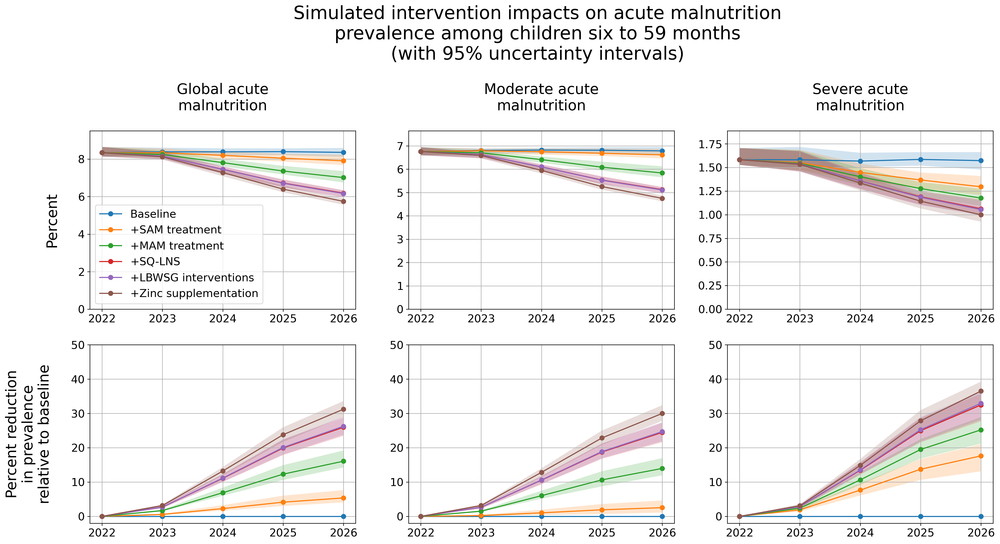

In [17]:
causes = ['wasted','moderate_acute_malnutrition','severe_acute_malnutrition']
cause_titles = ['Global acute\nmalnutrition\n',
               'Moderate acute\nmalnutrition\n',
               'Severe acute\nmalnutrition\n']
metrics = ['value','percent_reduction']

fig, axs = plt.subplots(len(metrics), len(causes),dpi=250)
for metric in metrics:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'prevalence', 
                                        metric, 
                                        'baseline')
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[metrics.index(metric),causes.index(cause)]   
        for i in list(range(0,len(scenarios))):
            p_sub = p.loc[p.scenario==scenarios[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[i])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_ylim(0,p.loc[p.scenario=='baseline']['value','97.5%'].max()*1.1)
            pos.set_title(cause_titles[causes.index(cause)],size=20)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent\n',size=20)
                pos.legend(#['Baseline','+Wasting Treatment','+SQ-LNS','+Zinc supplementation'], 
                       fontsize=15)
        if metric=='percent_reduction':
            pos.set_ylim(-2,50)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent reduction\nin prevalence\nrelative to baseline\n',size=20)

plt.subplots_adjust(right=len(causes), top=len(metrics))
#plt.legend(['Baseline','Alternative scenario 1','Alternative scenario 2'], bbox_to_anchor=[0.25,4.15], fontsize=20)
plt.suptitle('Simulated intervention impacts on acute malnutrition\nprevalence among children six to 59 months\n(with 95% uncertainty intervals)',
             y=2.6,x=1.55,size=25)

<ipython-input-5-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-5-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'


Text(1.5, 2.7, 'Simulated intervention impacts on acute malnutrition\ncross-sectional exposure among children six to 11 months\n(with 95% uncertainty intervals)')

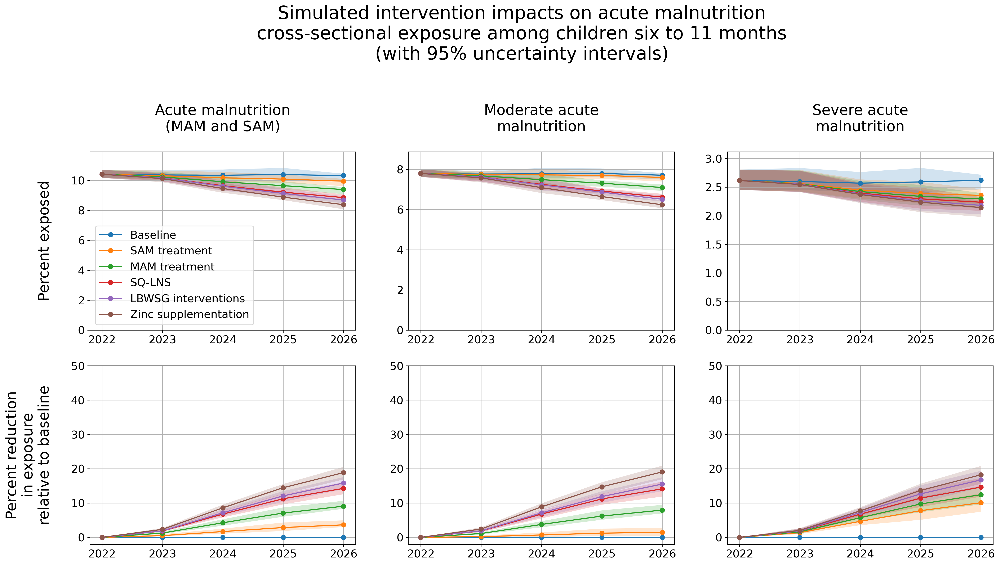

In [11]:
causes = ['wasted','moderate_acute_malnutrition','severe_acute_malnutrition']
cause_titles = ['Acute malnutrition\n(MAM and SAM)\n',
               'Moderate acute\nmalnutrition\n',
               'Severe acute\nmalnutrition\n']
metrics = ['value','percent_reduction']

fig, axs = plt.subplots(len(metrics), len(causes),dpi=250)
for metric in metrics:
    data = calculate_wasting_values(output_dir, ['6-11_months'], ['year'], 
                                        'prevalence', 
                                        metric, 
                                        'baseline')
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[metrics.index(metric),causes.index(cause)]   
        for i in list(range(0,len(scenarios))):
            p_sub = p.loc[p.scenario==scenarios[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[i])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_ylim(0,p.loc[p.scenario=='baseline']['value','97.5%'].max()*1.1)
            pos.set_title(cause_titles[causes.index(cause)],size=20)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent exposed\n',size=20)
                pos.legend(#['Baseline','+Wasting Treatment','+SQ-LNS','+Zinc supplementation'], 
                       fontsize=15)
        if metric=='percent_reduction':
            pos.set_ylim(-2,50)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent reduction\nin exposure\nrelative to baseline\n',size=20)

plt.subplots_adjust(right=len(causes), top=len(metrics))
#plt.legend(['Baseline','Alternative scenario 1','Alternative scenario 2'], bbox_to_anchor=[0.25,4.15], fontsize=20)
plt.suptitle('Simulated intervention impacts on acute malnutrition\ncross-sectional exposure among children six to 11 months\n(with 95% uncertainty intervals)',
             y=2.7,x=1.5,size=25)

# Finding 2: incidence

In [25]:
format_2026_table('incidence', 'value', 'baseline')

/tmp/ipykernel_604473/1651436955.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
/tmp/ipykernel_604473/1651436955.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'


scenario  \
                              
cause                         
0                  baseline   
3             sam_treatment   
2             mam_treatment   
4                     sqlns   
1       lbwsg_interventions   
5      zinc_supplementation   

                                                             result  \
                                                                      
cause mild_child_wasting_to_moderate_acute_malnutrition_event_count   
0                                 23873 (22118 to 25749)              
3                                 24108 (22422 to 25991)              
2                                 24603 (22896 to 26550)              
4                                 21028 (19512 to 22271)              
1                                 21022 (19511 to 22253)              
5                                 19236 (17867 to 20566)              

                                                                            \
                                                                             
cause moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count   
0                                    5531 (4868 to 6379)                     
3                                    5368 (4759 to 6181)                     
2                                    4720 (4222 to 5417)                     
4                                    4144 (3670 to 4830)                     
1                                    4128 (3655 to 4808)                     
5                                    3833 (3423 to 4431)                     

                               
                               
cause                  wasted  
0      29404 (27738 to 31193)  
3      29476 (27819 to 31325)  
2      29323 (27597 to 31338)  
4      25173 (23613 to 26475)  
1      25151 (23582 to 26451)  
5      23068 (21608 to 24511)

In [26]:
format_2026_table('incidence', 'absolute_reduction', 'baseline')

/tmp/ipykernel_604473/1651436955.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
/tmp/ipykernel_604473/1651436955.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'


scenario  \
                              
cause                         
0                  baseline   
3             sam_treatment   
2             mam_treatment   
4                     sqlns   
1       lbwsg_interventions   
5      zinc_supplementation   

                                                             result  \
                                                                      
cause mild_child_wasting_to_moderate_acute_malnutrition_event_count   
0                                             0 (0 to 0)              
3                                    -235 (-307 to -169)              
2                                    -730 (-911 to -591)              
4                                    2845 (1883 to 3802)              
1                                    2851 (1880 to 3822)              
5                                    4638 (4108 to 5611)              

                                                                            \
                                                                             
cause moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count   
0                                             0 (0 to 0)                     
3                                        163 (59 to 302)                     
2                                      811 (611 to 1054)                     
4                                    1387 (1163 to 1627)                     
1                                    1403 (1181 to 1646)                     
5                                    1698 (1435 to 1948)                     

                            
                            
cause               wasted  
0               0 (0 to 0)  
3         -72 (-165 to 20)  
2         81 (-145 to 348)  
4      4232 (3073 to 5268)  
1      4254 (3091 to 5285)  
5      6336 (5660 to 7287)

In [27]:
format_2026_table('incidence', 'percent_reduction', 'baseline')

/tmp/ipykernel_604473/1651436955.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
/tmp/ipykernel_604473/1651436955.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'


scenario  \
                              
cause                         
0                  baseline   
3             sam_treatment   
2             mam_treatment   
4                     sqlns   
1       lbwsg_interventions   
5      zinc_supplementation   

                                                             result  \
                                                                      
cause mild_child_wasting_to_moderate_acute_malnutrition_event_count   
0                                       0.0 (0.0 to 0.0)              
3                                    -1.0 (-1.4 to -0.7)              
2                                    -3.1 (-3.7 to -2.4)              
4                                     11.9 (8.2 to 15.4)              
1                                     11.9 (8.2 to 15.4)              
5                                    19.4 (17.5 to 22.3)              

                                                                            \
                                                                             
cause moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count   
0                                       0.0 (0.0 to 0.0)                     
3                                       2.9 (1.2 to 5.1)                     
2                                    14.6 (12.4 to 17.7)                     
4                                    25.0 (22.7 to 27.9)                     
1                                    25.3 (22.9 to 28.1)                     
5                                    30.7 (28.3 to 33.2)                     

                            
                            
cause               wasted  
0         0.0 (0.0 to 0.0)  
3       -0.2 (-0.5 to 0.1)  
2        0.3 (-0.5 to 1.2)  
4      14.4 (10.8 to 17.5)  
1      14.4 (10.9 to 17.5)  
5      21.5 (19.6 to 24.2)

<ipython-input-5-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-5-bd32712bcfec>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'
<ipython-input-5-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.htm

Text(1, 3.5, 'Simulated intervention impacts on acute malnutrition\nincidence rates among children six to 59 months\n(with 95% uncertainty intervals)')

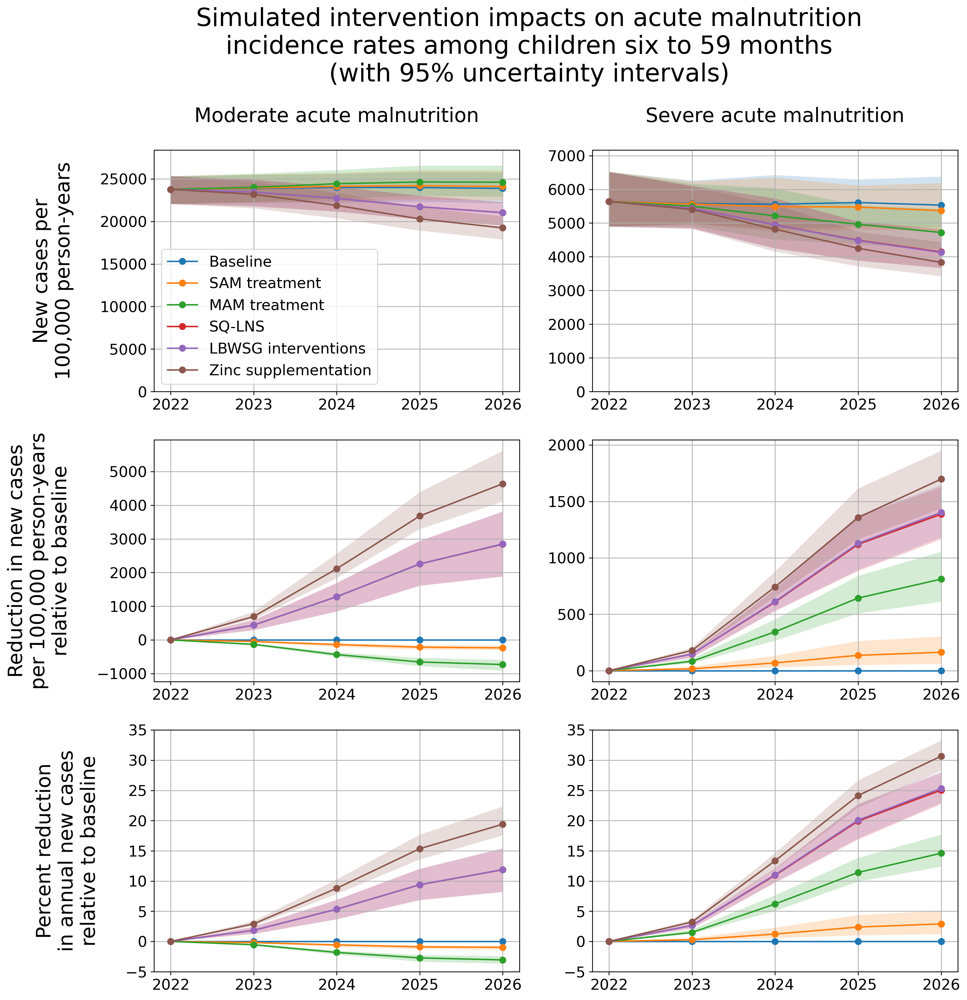

In [8]:
causes = ['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
          'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count',
          #'total_mam',
          #'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count'
         ]

cause_titles = ['Moderate acute malnutrition\n',
                'Severe acute malnutrition\n',
                #'All transitions\ninto MAM\n',
                #'MAM cases from\nspontaneous\nSAM recovery'
               ]
metrics = ['value','absolute_reduction','percent_reduction']
metric_titles=['New cases per\n100,000 person-years\n',
              'Reduction in new cases\nper 100,000 person-years\nrelative to baseline\n',
              'Percent reduction\nin annual new cases\nrelative to baseline\n']

fig, axs = plt.subplots(len(metrics), len(causes),dpi=250)
for metric in metrics:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'incidence', 
                                        metric, 
                                        'baseline')
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[metrics.index(metric),causes.index(cause)]   
        for i in list(range(0,len(scenarios))):
            p_sub = p.loc[p.scenario==scenarios[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[i])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if causes.index(cause)==0:
            pos.set_ylabel(metric_titles[metrics.index(metric)],size=20)
            if metrics.index(metric)==0:
                pos.legend(#['Baseline','Alternative scenario 1','Alternative scenario 2'],
                      #bbox_to_anchor=[0.25,4.15], 
                       fontsize=15)
        if metrics.index(metric)==0:
            pos.set_title(cause_titles[causes.index(cause)],size=20)
            pos.set_ylim(0,p.loc[p.scenario=='baseline']['value','97.5%'].max()*1.1)
        if metric=='percent_reduction':
            pos.set_ylim(-5,35)
plt.subplots_adjust(right=len(causes), top=len(metrics))
#plt.legend(['Baseline','Alternative scenario 1','Alternative scenario 2'], bbox_to_anchor=[0.25,4.15], fontsize=20)
plt.suptitle('Simulated intervention impacts on acute malnutrition\nincidence rates among children six to 59 months\n(with 95% uncertainty intervals)',
             y=len(metrics)+.5,x=1,size=25)

# Finding 3: relative to prior scenarios

In [16]:
relative_scenarios = ['baseline','sam_treatment','mam_treatment','sqlns','lbwsg_interventions']
table = pd.DataFrame()
for relative_scenario in relative_scenarios:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'prevalence', 
                                        'percent_reduction', 
                                        relative_scenario)
    data['relative_scenario'] = relative_scenario
    table = pd.concat([data,table])
table['result'] = (table['value','mean'].round(1).astype(str)
                  + ' ('
                  + table['value','2.5%'].round(1).astype(str)
                  + ' to '
                  + table['value','97.5%'].round(1).astype(str)
                  + ')')
table = table.loc[(((table.scenario=='mam_treatment')&(table.relative_scenario=='sam_treatment'))
         |((table.scenario=='sqlns')&(table.relative_scenario=='mam_treatment'))
         |((table.scenario=='sam_treatment')&(table.relative_scenario=='baseline'))
         |((table.scenario=='lbwsg_interventions')&(table.relative_scenario=='sqlns'))
         |((table.scenario=='zinc_supplementation')&(table.relative_scenario=='lbwsg_interventions')))
         &(table.year==2026)][['result','scenario','relative_scenario','cause']]
table.set_index(['scenario','relative_scenario','cause']).unstack()

# note these are not in order
# prevalence percent reduction relative to prior scenario

<ipython-input-5-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'


result  \
                                                                
cause                                      mild_child_wasting   
scenario             relative_scenario                          
lbwsg_interventions  sqlns                 -0.0 (-0.1 to 0.0)   
mam_treatment        sam_treatment        -3.0 (-3.4 to -2.5)   
sam_treatment        baseline             -1.4 (-2.0 to -1.1)   
sqlns                mam_treatment        -2.1 (-2.8 to -1.3)   
zinc_supplementation lbwsg_interventions     1.9 (1.1 to 2.6)   

                                                                      \
                                                                       
cause                                    moderate_acute_malnutrition   
scenario             relative_scenario                                 
lbwsg_interventions  sqlns                          0.3 (0.2 to 0.4)   
mam_treatment        sam_treatment               11.7 (10.9 to 12.9)   
sam_treatment        baseline                       2.5 (1.1 to 4.6)   
sqlns                mam_treatment                12.2 (8.8 to 14.9)   
zinc_supplementation lbwsg_interventions            7.0 (5.5 to 9.4)   

                                                                    \
                                                                     
cause                                    severe_acute_malnutrition   
scenario             relative_scenario                               
lbwsg_interventions  sqlns                        0.7 (0.3 to 1.1)   
mam_treatment        sam_treatment               9.2 (8.0 to 10.6)   
sam_treatment        baseline                  17.6 (13.1 to 21.1)   
sqlns                mam_treatment               9.7 (7.9 to 12.0)   
zinc_supplementation lbwsg_interventions          5.3 (4.2 to 7.3)   

                                                                       \
                                                                        
cause                                    susceptible_to_child_wasting   
scenario             relative_scenario                                  
lbwsg_interventions  sqlns                        -0.1 (-0.1 to -0.0)   
mam_treatment        sam_treatment                -1.9 (-2.1 to -1.7)   
sam_treatment        baseline                     -1.0 (-1.4 to -0.7)   
sqlns                mam_treatment                -1.9 (-2.4 to -1.3)   
zinc_supplementation lbwsg_interventions          -1.8 (-2.2 to -1.3)   

                                                               
                                                               
cause                                                  wasted  
scenario             relative_scenario                         
lbwsg_interventions  sqlns                   0.4 (0.3 to 0.5)  
mam_treatment        sam_treatment        11.3 (10.5 to 12.5)  
sam_treatment        baseline                5.4 (4.1 to 7.6)  
sqlns                mam_treatment         11.8 (8.7 to 14.3)  
zinc_supplementation lbwsg_interventions     6.7 (5.4 to 9.0)

<ipython-input-5-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-5-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-5-bd32712bcfec>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

Text(1.5, 5.7, 'Percent reduction in simulated acute malnutrition\ncross sectional exposure among children six to 59 months\n(with 95% uncertainty intervals)')

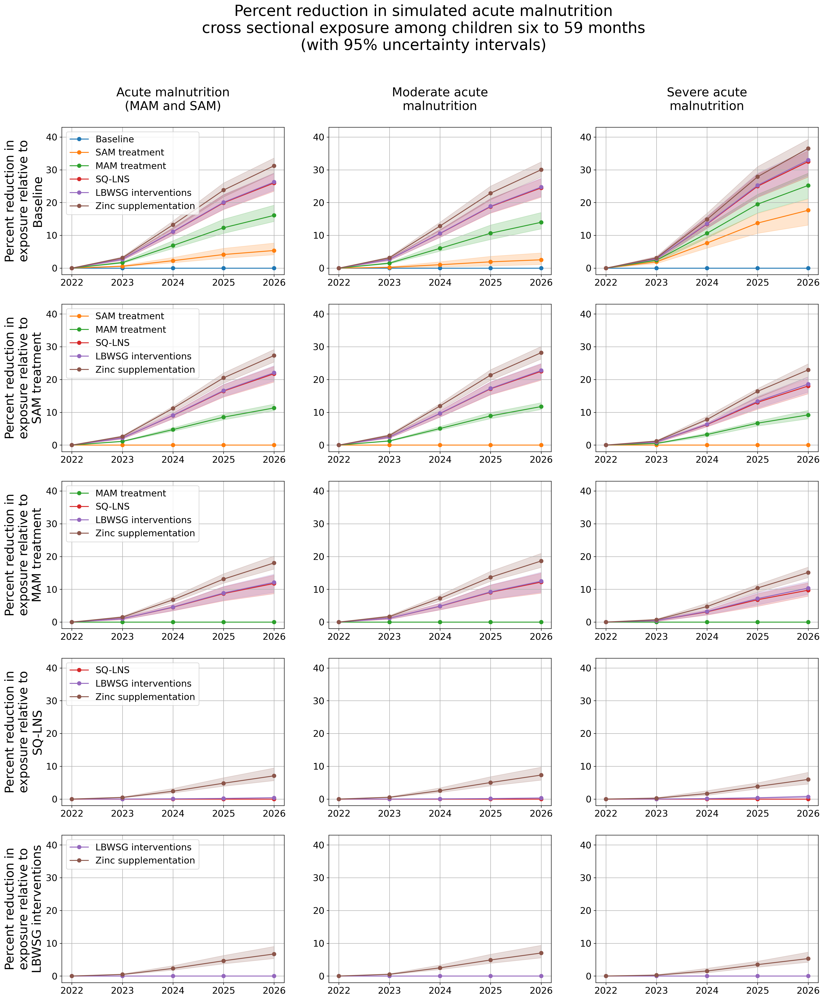

In [17]:
relative_scenarios = ['baseline','sam_treatment','mam_treatment','sqlns','lbwsg_interventions']

causes = ['wasted','moderate_acute_malnutrition','severe_acute_malnutrition']
cause_titles = ['Acute malnutrition\n(MAM and SAM)\n',
               'Moderate acute\nmalnutrition\n',
               'Severe acute\nmalnutrition\n']

fig, axs = plt.subplots(len(relative_scenarios), len(causes),dpi=250)
for relative_scenario in relative_scenarios:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'prevalence', 
                                        'percent_reduction', 
                                        relative_scenario)
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[relative_scenarios.index(relative_scenario),causes.index(cause)]  
        scens = scenarios[scenarios.index(relative_scenario):len(scenarios)]
        
        for scenario in scens:
            p_sub = p.loc[p.scenario==scenario]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', 
                     label=scenario_names[scenarios.index(scenario)],
                    color=scenario_colors[scenarios.index(scenario)])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], 
                             alpha=0.2, color=scenario_colors[scenarios.index(scenario)])
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        pos.set_ylim(-2,43)
        if relative_scenarios.index(relative_scenario)==0:
            pos.set_title(cause_titles[causes.index(cause)],size=20)
        if causes.index(cause)==0:
            pos.set_ylabel(f'Percent reduction in\nexposure relative to\n{scenario_names[relative_scenarios.index(relative_scenario)]}'
                               ,size=20)
            pos.legend(fontsize=15, loc='upper left')

plt.subplots_adjust(right=len(causes), top=len(relative_scenarios))
plt.suptitle('Percent reduction in simulated acute malnutrition\ncross sectional exposure among children six to 59 months\n(with 95% uncertainty intervals)',
             y=len(relative_scenarios) + 0.7,x=1.5,size=25)

In [19]:
relative_scenarios = ['baseline','sam_treatment','mam_treatment','sqlns','lbwsg_interventions']
table = pd.DataFrame()
for relative_scenario in relative_scenarios:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'incidence', 
                                        'absolute_reduction', 
                                        relative_scenario)
    data['relative_scenario'] = relative_scenario
    table = pd.concat([data,table])
table['result'] = (table['value','mean'].round(0).astype(int).astype(str)
                  + ' ('
                  + table['value','2.5%'].round(0).astype(int).astype(str)
                  + ' to '
                  + table['value','97.5%'].round(0).astype(int).astype(str)
                  + ')')

table = table.loc[(((table.scenario=='mam_treatment')&(table.relative_scenario=='sam_treatment'))
         |((table.scenario=='sqlns')&(table.relative_scenario=='mam_treatment'))
         |((table.scenario=='sam_treatment')&(table.relative_scenario=='baseline'))
         |((table.scenario=='lbwsg_interventions')&(table.relative_scenario=='sqlns'))
         |((table.scenario=='zinc_supplementation')&(table.relative_scenario=='lbwsg_interventions')))
         &(table.year==2026)
         &(table.cause.isin(['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
                            'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count']))][['result','scenario','relative_scenario','cause']]
table.set_index(['scenario','relative_scenario','cause']).unstack()

# note these are not in order
# incidence absolute reduction relative to prior scenario

<ipython-input-5-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-5-bd32712bcfec>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'


result  \
                                                                                                         
cause                                    mild_child_wasting_to_moderate_acute_malnutrition_event_count   
scenario             relative_scenario                                                                   
lbwsg_interventions  sqlns                                                    6 (-10 to 24)              
mam_treatment        sam_treatment                                      -495 (-646 to -394)              
sam_treatment        baseline                                           -235 (-307 to -169)              
sqlns                mam_treatment                                      3575 (2493 to 4575)              
zinc_supplementation lbwsg_interventions                                1787 (1416 to 2300)              

                                                                                                               
                                                                                                               
cause                                    moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count  
scenario             relative_scenario                                                                         
lbwsg_interventions  sqlns                                                     16 (6 to 28)                    
mam_treatment        sam_treatment                                         648 (530 to 764)                    
sam_treatment        baseline                                               163 (59 to 302)                    
sqlns                mam_treatment                                         576 (408 to 728)                    
zinc_supplementation lbwsg_interventions                                   295 (220 to 386)

In [20]:
relative_scenarios = ['baseline','sam_treatment','mam_treatment','sqlns','lbwsg_interventions']
table = pd.DataFrame()
for relative_scenario in relative_scenarios:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'incidence', 
                                        'percent_reduction', 
                                        relative_scenario)
    data['relative_scenario'] = relative_scenario
    table = pd.concat([data,table])
table['result'] = (table['value','mean'].round(1).astype(str)
                  + ' ('
                  + table['value','2.5%'].round(1).astype(str)
                  + ' to '
                  + table['value','97.5%'].round(1).astype(str)
                  + ')')
table = (table.loc[(((table.scenario=='mam_treatment')&(table.relative_scenario=='sam_treatment'))
         |((table.scenario=='sqlns')&(table.relative_scenario=='mam_treatment'))
         |((table.scenario=='sam_treatment')&(table.relative_scenario=='baseline'))
         |((table.scenario=='lbwsg_interventions')&(table.relative_scenario=='sqlns'))
         |((table.scenario=='zinc_supplementation')&(table.relative_scenario=='lbwsg_interventions')))
         &(table.year==2026)
         &(table.cause.isin(['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
                            'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count']))]
         [['result','scenario','relative_scenario','cause']])
table.set_index(['scenario','relative_scenario','cause']).unstack()

# note these are not in order
# incidence percent reduction relative to prior scenario

<ipython-input-5-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-5-bd32712bcfec>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'


result  \
                                                                                                         
cause                                    mild_child_wasting_to_moderate_acute_malnutrition_event_count   
scenario             relative_scenario                                                                   
lbwsg_interventions  sqlns                                                0.0 (-0.0 to 0.1)              
mam_treatment        sam_treatment                                      -2.1 (-2.6 to -1.7)              
sam_treatment        baseline                                           -1.0 (-1.4 to -0.7)              
sqlns                mam_treatment                                      14.5 (10.5 to 18.0)              
zinc_supplementation lbwsg_interventions                                  8.5 (6.7 to 10.9)              

                                                                                                               
                                                                                                               
cause                                    moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count  
scenario             relative_scenario                                                                         
lbwsg_interventions  sqlns                                                 0.4 (0.1 to 0.7)                    
mam_treatment        sam_treatment                                      12.1 (10.9 to 13.3)                    
sam_treatment        baseline                                              2.9 (1.2 to 5.1)                    
sqlns                mam_treatment                                       12.2 (9.3 to 15.3)                    
zinc_supplementation lbwsg_interventions                                   7.1 (5.9 to 9.0)

<ipython-input-5-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wasted['cause'] = 'wasted'
<ipython-input-5-bd32712bcfec>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_mam['cause'] = 'total_mam'
<ipython-input-5-bd32712bcfec>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.htm

Text(1, 5.5, 'Percent reduction in simulated acute malnutrition\nincidence rates among children six to 59 months\n(with 95% uncertainty intervals)')

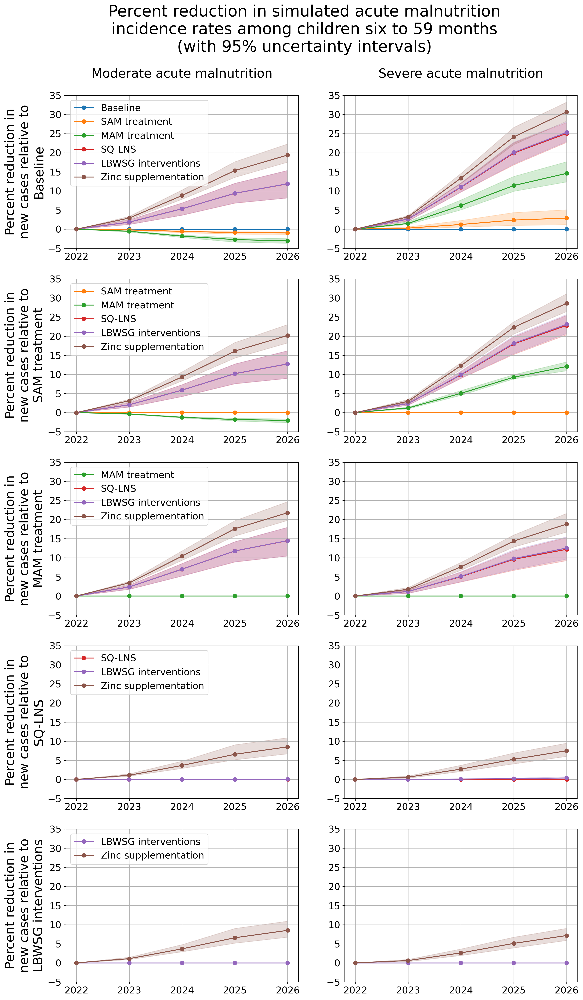

In [9]:
relative_scenarios = ['baseline','sam_treatment','mam_treatment','sqlns','lbwsg_interventions']
causes = ['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
          'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count',
         ]

cause_titles = ['Moderate acute malnutrition\n',
                'Severe acute malnutrition\n',
               ]

fig, axs = plt.subplots(len(relative_scenarios), len(causes),dpi=250)
for relative_scenario in relative_scenarios:
    data = calculate_wasting_values(output_dir, six_to_59_ages, ['year'], 
                                        'incidence', 
                                        'percent_reduction', 
                                        relative_scenario)
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[relative_scenarios.index(relative_scenario),causes.index(cause)]  
        scens = scenarios[scenarios.index(relative_scenario):len(scenarios)]
        
        for scenario in scens:
            p_sub = p.loc[p.scenario==scenario]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', 
                     label=scenario_names[scenarios.index(scenario)],
                    color=scenario_colors[scenarios.index(scenario)])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], 
                             alpha=0.2, color=scenario_colors[scenarios.index(scenario)])
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        pos.set_ylim(-5,35)
        if relative_scenarios.index(relative_scenario)==0:
            pos.set_title(cause_titles[causes.index(cause)],size=20)
        if causes.index(cause)==0:
            pos.set_ylabel(f'Percent reduction in\nnew cases relative to\n{scenario_names[relative_scenarios.index(relative_scenario)]}'
                               ,size=20)
            pos.legend(fontsize=15, loc='upper left')

plt.subplots_adjust(right=len(causes), top=len(relative_scenarios))
plt.suptitle('Percent reduction in simulated acute malnutrition\nincidence rates among children six to 59 months\n(with 95% uncertainty intervals)',
             y=len(relative_scenarios) + 0.5,x=1,size=25)

# Finding 4: stunting exposures

In [10]:
# stunting reduction
def calculate_stunting_values(output_dir, ages, strata_cols, metric, 
                             relative_scenario):
    data = pd.read_csv(output_dir + 'stunting_state_person_time.csv').drop(columns=['Unnamed: 0'])
    stunted = data.loc[data.cause.isin(['cat1','cat2'])]
    groupby_cols = ['input_draw','scenario','cause']
    stunted = (stunted.groupby([c for c in stunted.columns if c != 'cause' and c != 'value']).sum())
    stunted['cause'] = 'stunted'
    data = pd.concat([data,stunted.reset_index()],ignore_index=True)
    data = data.loc[data.age.isin(ages)]
    data = data.groupby(['input_draw','scenario'] + strata_cols + ['cause']).sum()
    data = data / data.groupby(['input_draw','scenario'] + strata_cols).sum() * 100
    if metric=='value':
        data = (data.groupby(['scenario','cause'] + strata_cols)
                    .describe(percentiles=[0.025,0.975]))
    else:
        data_baseline = (data.reset_index().loc[data.reset_index().scenario==relative_scenario]
                   .set_index(['input_draw','cause'] + strata_cols)
                   .drop(columns='scenario'))
        if metric=='percent_reduction':
            data = ((data_baseline - data.reset_index().set_index(['input_draw','cause'] + strata_cols + ['scenario']))
                    / data_baseline) * 100
        elif metric=='absolute_reduction':
            data = data_baseline - data.reset_index().set_index(['input_draw','cause'] + strata_cols + ['scenario'])
            
        data = (data.reset_index().groupby(['scenario','cause'] + strata_cols)
                .describe(percentiles=[0.025,0.975])).drop(columns='input_draw')
        
    return data[['value']].reset_index()

In [11]:
def plot_values_by_year(data,
                          title, 
                          ylabel,
                          legend=True):
    plt.figure(dpi=120)
    p = data.copy()
    for i in ['baseline','sam_treatment','mam_treatment','sqlns','lbwsg_interventions','zinc_supplementation']:
        p_sub = p.loc[p.scenario==i]
        plt.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=i)
        plt.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
    if legend==True:
        plt.legend(#['Baseline',
                #'Wasting treatment scale-up',
                #'SQ-LNS and wasting treatment scale-up'],
              fontsize=13)
    plt.xticks(p.year.unique(),size=14)
    plt.yticks(size=14)
    plt.ylabel(ylabel,size=14)
    plt.ylim(0,p['value','97.5%'].max()*1.12)
    plt.grid()
    plt.title(title, size=18)

In [23]:
b = calculate_stunting_values(output_dir, six_to_59_ages, ['year'], 'value', 
                             'baseline')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(1).astype(str)
              + ' ('
              + b['value','2.5%'].round(1).astype(str)
              + ', '
              + b['value','97.5%'].round(1).astype(str)
              + ')')
b.loc[b.cause=='cat1'].drop(columns='value')

# severe stunting

/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,cause,year,result
,,,,
4,baseline,cat1,2026,"12.8 (12.0, 13.3)"
29,lbwsg_interventions,cat1,2026,"11.2 (10.0, 12.2)"
54,mam_treatment,cat1,2026,"12.8 (12.1, 13.3)"
79,sam_treatment,cat1,2026,"12.8 (12.0, 13.3)"
104,sqlns,cat1,2026,"11.2 (10.0, 12.2)"
129,zinc_supplementation,cat1,2026,"11.2 (10.0, 12.2)"


In [24]:
b = calculate_stunting_values(output_dir, six_to_59_ages, ['year'], 'value', 
                             'baseline')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(1).astype(str)
              + ' ('
              + b['value','2.5%'].round(1).astype(str)
              + ', '
              + b['value','97.5%'].round(1).astype(str)
              + ')')
b.loc[b.cause=='cat2'].drop(columns='value')

# moderate stunting

/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,cause,year,result
,,,,
9,baseline,cat2,2026,"13.8 (13.3, 14.3)"
34,lbwsg_interventions,cat2,2026,"13.2 (12.4, 13.9)"
59,mam_treatment,cat2,2026,"13.8 (13.3, 14.3)"
84,sam_treatment,cat2,2026,"13.8 (13.3, 14.3)"
109,sqlns,cat2,2026,"13.3 (12.5, 14.0)"
134,zinc_supplementation,cat2,2026,"13.2 (12.4, 13.9)"


In [25]:
b = calculate_stunting_values(output_dir, six_to_59_ages, ['year'], 'percent_reduction', 
                             'baseline')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(1).astype(str)
              + ' ('
              + b['value','2.5%'].round(1).astype(str)
              + ', '
              + b['value','97.5%'].round(1).astype(str)
              + ')')
b.loc[b.cause=='stunted'].drop(columns='value')

# total stunting

/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,cause,year,result
,,,,
24,baseline,stunted,2026,"0.0 (0.0, 0.0)"
49,lbwsg_interventions,stunted,2026,"8.4 (5.6, 12.1)"
74,mam_treatment,stunted,2026,"-0.0 (-0.0, -0.0)"
99,sam_treatment,stunted,2026,"-0.0 (-0.0, -0.0)"
124,sqlns,stunted,2026,"7.9 (5.2, 11.4)"
149,zinc_supplementation,stunted,2026,"8.4 (5.6, 12.0)"


In [ ]:
causes = ['stunted',
          'cat2',
          'cat1',]

cause_titles = ['Stunted (moderate\nand severe)\n',
                'Moderate stunting\n',
                'Severe stunting\n'
               ]

metrics = ['value','percent_reduction']

scens = ['baseline','sqlns','lbwsg_interventions']

fig, axs = plt.subplots(len(metrics), len(causes),dpi=250)
for metric in metrics:
    data = calculate_stunting_values(output_dir, six_to_59_ages, ['year'], 
                                        metric, 
                                        'baseline')
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[metrics.index(metric),causes.index(cause)]   
        for i in list(range(0,len(scens))):
            p_sub = p.loc[p.scenario==scens[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[scenarios.index(scens[i])],
                    c = scenario_colors[scenarios.index(scens[i])])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2,
                            color = scenario_colors[scenarios.index(scens[i])])
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_ylim(0,p.loc[p.scenario=='baseline']['value','97.5%'].max()*1.1)
            pos.set_title(cause_titles[causes.index(cause)],size=20)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent exposed\n',size=20)
                pos.legend(#['Baseline','Alternative scenario 1','Alternative scenario 2'],
                       fontsize=15)
        else:
            pos.set_ylim(-2,23)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent reduction in exposure\nrelative to baseline\n',size=20)


plt.subplots_adjust(right=len(causes), top=len(metrics))
plt.suptitle('Simulated intervention impacts on child stunting\nexposure among children six to 59 months\n(with 95% uncertainty intervals)',
             y=2.6,x=1.5,size=25)

Text(1.5, 2.6, 'Simulated intervention impacts on child stunting\nexposure among children six to 59 months\n(with 95% uncertainty intervals)')

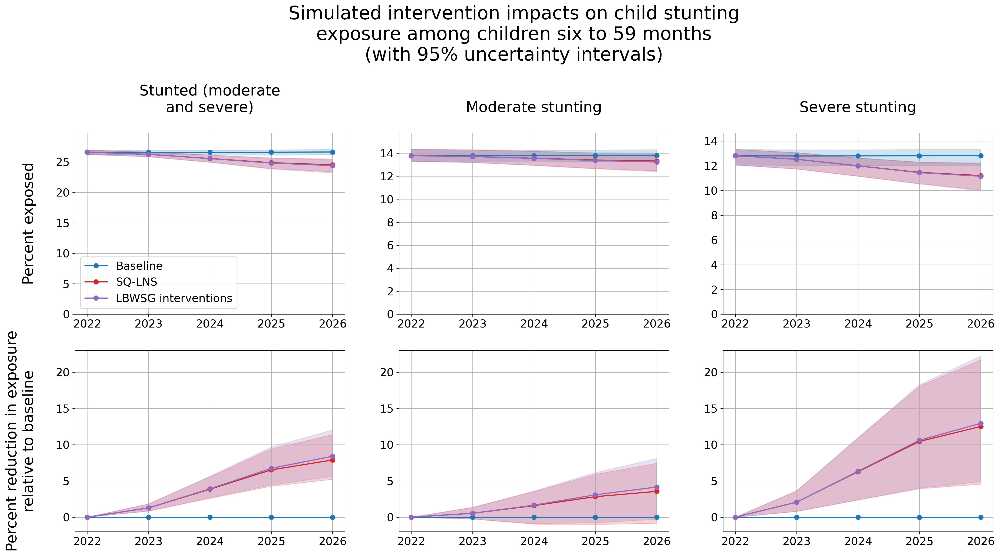

In [26]:
causes = ['stunted',
          'cat2',
          'cat1',]

cause_titles = ['Stunted (moderate\nand severe)\n',
                'Moderate stunting\n',
                'Severe stunting\n'
               ]

metrics = ['value','percent_reduction']

scens = ['baseline','sqlns','lbwsg_interventions']

fig, axs = plt.subplots(len(metrics), len(causes),dpi=250)
for metric in metrics:
    data = calculate_stunting_values(output_dir, six_to_59_ages, ['year'], 
                                        metric, 
                                        'baseline')
    for cause in causes:
        p = data.loc[data.cause==cause]
        pos = axs[metrics.index(metric),causes.index(cause)]   
        for i in list(range(0,len(scens))):
            p_sub = p.loc[p.scenario==scens[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[scenarios.index(scens[i])],
                    c = scenario_colors[scenarios.index(scens[i])])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2,
                            color = scenario_colors[scenarios.index(scens[i])])
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_ylim(0,p.loc[p.scenario=='baseline']['value','97.5%'].max()*1.1)
            pos.set_title(cause_titles[causes.index(cause)],size=20)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent exposed\n',size=20)
                pos.legend(#['Baseline','Alternative scenario 1','Alternative scenario 2'],
                       fontsize=15)
        else:
            pos.set_ylim(-2,23)
            if causes.index(cause)==0:
                pos.set_ylabel('Percent reduction in exposure\nrelative to baseline\n',size=20)


plt.subplots_adjust(right=len(causes), top=len(metrics))
plt.suptitle('Simulated intervention impacts on child stunting\nexposure among children six to 59 months\n(with 95% uncertainty intervals)',
             y=2.6,x=1.5,size=25)

# Finding 5: mortality and morbidity outcomes 6-59 months

In [8]:
def calculate_mortality_6_to_59_values(output_dir, ages, strata_cols, metric, 
                             relative_scenario, measure):
    if measure == 'dalys':
        ylls = pd.read_csv(output_dir + 'ylls.csv').drop(columns=['Unnamed: 0','measure'])
        ylds = pd.read_csv(output_dir + 'ylds.csv').drop(columns=['Unnamed: 0','measure'])
        data = pd.concat([ylls,ylds]).groupby([c for c in ylls.columns if c != 'value' and c != 'cause']).sum().reset_index()
    else:
        data = pd.read_csv(output_dir + f'{measure}.csv').drop(columns=['Unnamed: 0'])
    pt = pd.read_csv(output_dir + 'wasting_state_person_time.csv').drop(columns='Unnamed: 0')
    groupby_cols = ['input_draw','scenario']
    data = data.loc[data.age.isin(ages)]
    pt = pt.loc[pt.age.isin(ages)]
    data = (data.groupby(['input_draw','scenario'] + strata_cols).sum()
            / pt.groupby(['input_draw','scenario'] + strata_cols).sum()
            * 100_000)
    if metric=='val':
        data = (data.groupby(['scenario'] + strata_cols)
                    .describe(percentiles=[0.025,0.975]))
    else:
        data_baseline = (data.reset_index().loc[data.reset_index().scenario==relative_scenario]
                   .set_index(['input_draw'] + strata_cols)
                   .drop(columns='scenario'))
        if metric=='percent_reduction':
            data = ((data_baseline - data.reset_index().set_index(['input_draw'] + strata_cols + ['scenario']))
                    / data_baseline) * 100
        elif metric=='absolute_reduction':
            data = data_baseline - data.reset_index().set_index(['input_draw'] + strata_cols + ['scenario'])
            
        data = (data.reset_index().groupby(['scenario'] + strata_cols)
                .describe(percentiles=[0.025,0.975])).drop(columns='input_draw')
        
    return data[['value']].reset_index()

In [9]:
b = calculate_mortality_6_to_59_values(output_dir, ages, ['year'], 'value', 
                             'baseline', 'ylds')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(0).astype(int).astype(str)
              + ' ('
              + b['value','2.5%'].round(0).astype(int).astype(str)
              + ' to '
              + b['value','97.5%'].round(0).astype(int).astype(str)
              + ')')
b['scenario_order'] = np.where(b.scenario=='baseline',0,
                                  np.where(b.scenario=='sam_treatment',1,
                                          np.where(b.scenario=='mam_treatment',2,
                                                  np.where(b.scenario=='sqlns',3,
                                                          np.where(b.scenario=='lbwsg_interventions',4,5)))))
b=b.sort_values(by='scenario_order')
b.drop(columns='value')

/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,year,result,scenario_order
,,,,
4,baseline,2026,509 (337 to 662),0
19,sam_treatment,2026,470 (306 to 614),1
14,mam_treatment,2026,450 (294 to 593),2
24,sqlns,2026,425 (278 to 566),3
9,lbwsg_interventions,2026,424 (277 to 564),4
29,zinc_supplementation,2026,376 (248 to 506),5


Text(1, 3.6, 'Simulated morbidity and mortality outcomes\namong children aged six to 59 months\n(with 95% uncertainty intervals)')

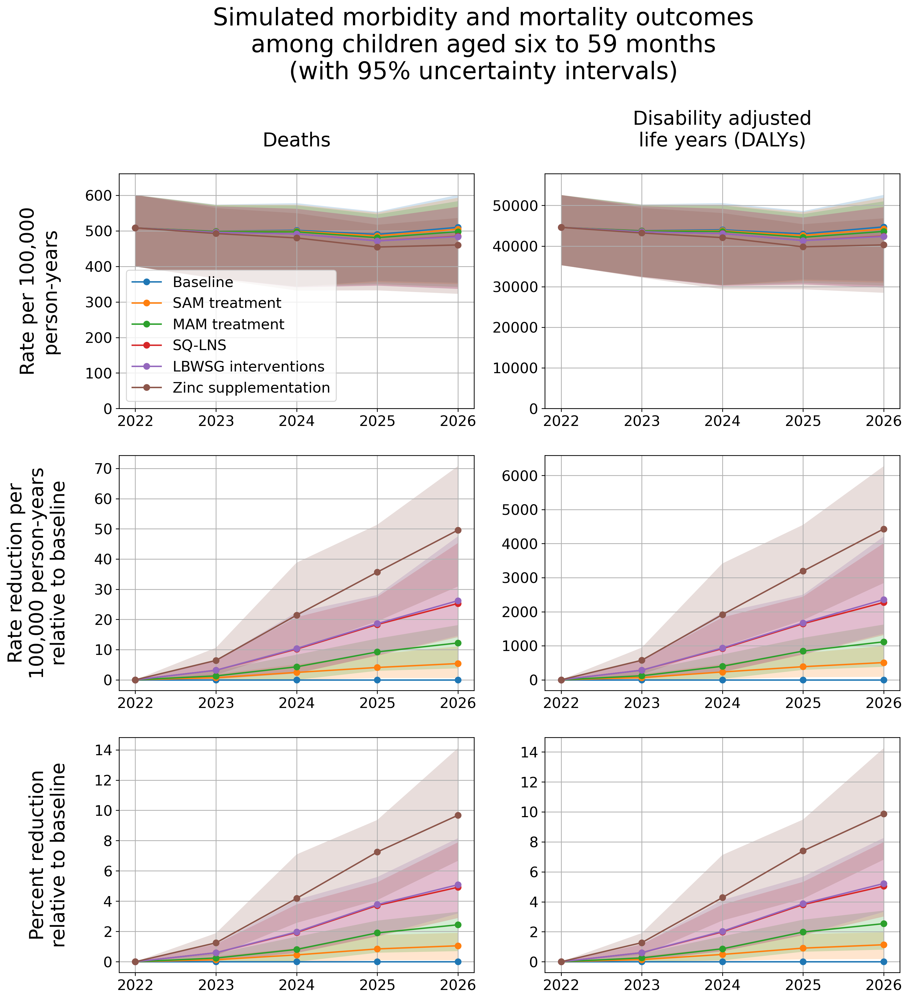

In [10]:
measures = ['deaths',
          'dalys',
         # 'ylls',
         #'ylds']
           ]
measure_titles = ['Deaths\n',
                 'Disability adjusted\nlife years (DALYs)\n',
                 'Years of life\nlost (YLLs)\n',
                 'Years lived with\ndisability (YLDs)\n']

metrics = ['val','absolute_reduction','percent_reduction']
metric_titles = ['Rate per 100,000\nperson-years\n',
                 'Rate reduction per\n100,000 person-years\nrelative to baseline\n',
                 'Percent reduction\nrelative to baseline\n'
                ]

fig, axs = plt.subplots(len(metrics), 
                        len(measures),
                        dpi=250)
for metric in metrics:
    for measure in measures:
        data = calculate_mortality_6_to_59_values(output_dir, ages, ['year'], metric, 
                             'baseline', measure)
        pos = axs[metrics.index(metric),measures.index(measure)]   
        for i in list(range(0,len(scenarios))):
            p_sub = data.loc[data.scenario==scenarios[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[i])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_title(measure_titles[measures.index(measure)],size=20)
            pos.set_ylim(0,data.loc[data.scenario=='baseline']['value','97.5%'].max()*1.1)
            if measures.index(measure)==0:
                pos.legend(fontsize=15)
        if measures.index(measure)==0:
            pos.set_ylabel(metric_titles[metrics.index(metric)],size=20)
        #if metric=='percent_reduction':
            #pos.set_ylim(-2,16)

plt.subplots_adjust(right=len(measures), top=len(metrics))
plt.suptitle('Simulated morbidity and mortality outcomes\namong children aged six to 59 months\n(with 95% uncertainty intervals)',
             y=3.6,x=1,size=25)

# Finding 5: mortality and morbidity outcomes U5


In [11]:
def calculate_mortality_u5_values(output_dir, ages, strata_cols, metric, 
                             relative_scenario, measure):
    if measure == 'dalys':
        ylls = pd.read_csv(output_dir + 'ylls.csv').drop(columns=['Unnamed: 0','measure'])
        ylds = pd.read_csv(output_dir + 'ylds.csv').drop(columns=['Unnamed: 0','measure'])
        data = pd.concat([ylls,ylds]).groupby([c for c in ylls.columns if c != 'value' and c != 'cause']).sum().reset_index()
    else:
        data = pd.read_csv(output_dir + f'{measure}.csv').drop(columns=['Unnamed: 0'])
    
    # filter out diarrheal among u6 months for zinc scenario
    data_lbwsg = data.loc[(data.age.isin(['early_neonatal','late_neonatal','1-5_months']))
                             &(data.scenario=='lbwsg_interventions')]
    data_lbwsg['scenario'] = 'zinc_supplementation'
    data_zinc = data.loc[(data.scenario=='zinc_supplementation')&(data.age.isin(['6-11_months',
                                                                                '12_to_23_months',
                                                                                '2_to_4']))]
    data_zinc = pd.concat([data_zinc,data_lbwsg])
    data = pd.concat([data.loc[data.scenario!='zinc_supplementation'],
                     data_zinc])
    
    pt = pd.read_csv(output_dir + 'wasting_state_person_time.csv').drop(columns='Unnamed: 0')
    groupby_cols = ['input_draw','scenario']
    data = (data.groupby(['input_draw','scenario'] + strata_cols).sum()
            / pt.groupby(['input_draw','scenario'] + strata_cols).sum()
            * 100_000)
    if metric=='val':
        data = (data.groupby(['scenario'] + strata_cols)
                    .describe(percentiles=[0.025,0.975]))
    else:
        data_baseline = (data.reset_index().loc[data.reset_index().scenario==relative_scenario]
                   .set_index(['input_draw'] + strata_cols)
                   .drop(columns='scenario'))
        if metric=='percent_reduction':
            data = ((data_baseline - data.reset_index().set_index(['input_draw'] + strata_cols + ['scenario']))
                    / data_baseline) * 100
        elif metric=='absolute_reduction':
            data = data_baseline - data.reset_index().set_index(['input_draw'] + strata_cols + ['scenario'])
            
        data = (data.reset_index().groupby(['scenario'] + strata_cols)
                .describe(percentiles=[0.025,0.975])).drop(columns='input_draw')
        
    return data[['value']].reset_index()

In [23]:
b = calculate_mortality_u5_values(output_dir, ages, ['year'], 'absolute_reduction', 
                             'baseline', 'ylds')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(0).astype(int).astype(str)
              + ' ('
              + b['value','2.5%'].round(0).astype(int).astype(str)
              + ' to '
              + b['value','97.5%'].round(0).astype(int).astype(str)
              + ')')
b['scenario_order'] = np.where(b.scenario=='baseline',0,
                                  np.where(b.scenario=='sam_treatment',1,
                                          np.where(b.scenario=='mam_treatment',2,
                                                  np.where(b.scenario=='sqlns',3,
                                                          np.where(b.scenario=='lbwsg_interventions',4,5)))))
b=b.sort_values(by='scenario_order')
b.drop(columns='value')

<ipython-input-11-9e59ce8942d9>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_lbwsg['scenario'] = 'zinc_supplementation'
/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,year,result,scenario_order
,,,,
4,baseline,2026,0 (0 to 0),0
19,sam_treatment,2026,36 (26 to 46),1
14,mam_treatment,2026,53 (38 to 65),2
24,sqlns,2026,76 (53 to 95),3
9,lbwsg_interventions,2026,79 (55 to 98),4
29,zinc_supplementation,2026,122 (81 to 156),5


In [24]:
b = calculate_mortality_u5_values(output_dir, ages, ['year'], 'percent_reduction', 
                             'baseline', 'ylds')
b = b.loc[b.year==2026]
b['result'] = (b['value','mean'].round(1).astype(str)
              + ' ('
              + b['value','2.5%'].round(1).astype(str)
              + ' to '
              + b['value','97.5%'].round(1).astype(str)
              + ')')
b['scenario_order'] = np.where(b.scenario=='baseline',0,
                                  np.where(b.scenario=='sam_treatment',1,
                                          np.where(b.scenario=='mam_treatment',2,
                                                  np.where(b.scenario=='sqlns',3,
                                                          np.where(b.scenario=='lbwsg_interventions',4,5)))))
b=b.sort_values(by='scenario_order')
b.drop(columns='value')

<ipython-input-11-9e59ce8942d9>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_lbwsg['scenario'] = 'zinc_supplementation'
/ihme/code/alibow/miniconda/envs/vivarium_ciff_sam/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,scenario,year,result,scenario_order
,,,,
4,baseline,2026,0.0 (0.0 to 0.0),0
19,sam_treatment,2026,6.7 (4.9 to 8.7),1
14,mam_treatment,2026,9.9 (8.1 to 12.4),2
24,sqlns,2026,14.1 (11.3 to 16.6),3
9,lbwsg_interventions,2026,14.7 (11.9 to 17.3),4
29,zinc_supplementation,2026,22.4 (20.0 to 25.4),5


<ipython-input-25-9e59ce8942d9>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_lbwsg['scenario'] = 'zinc_supplementation'
<ipython-input-25-9e59ce8942d9>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_lbwsg['scenario'] = 'zinc_supplementation'
<ipython-input-25-9e59ce8942d9>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

Text(1, 3.6, 'Simulated morbidity and mortality outcomes\namong children under 5\n(with 95% uncertainty intervals)')

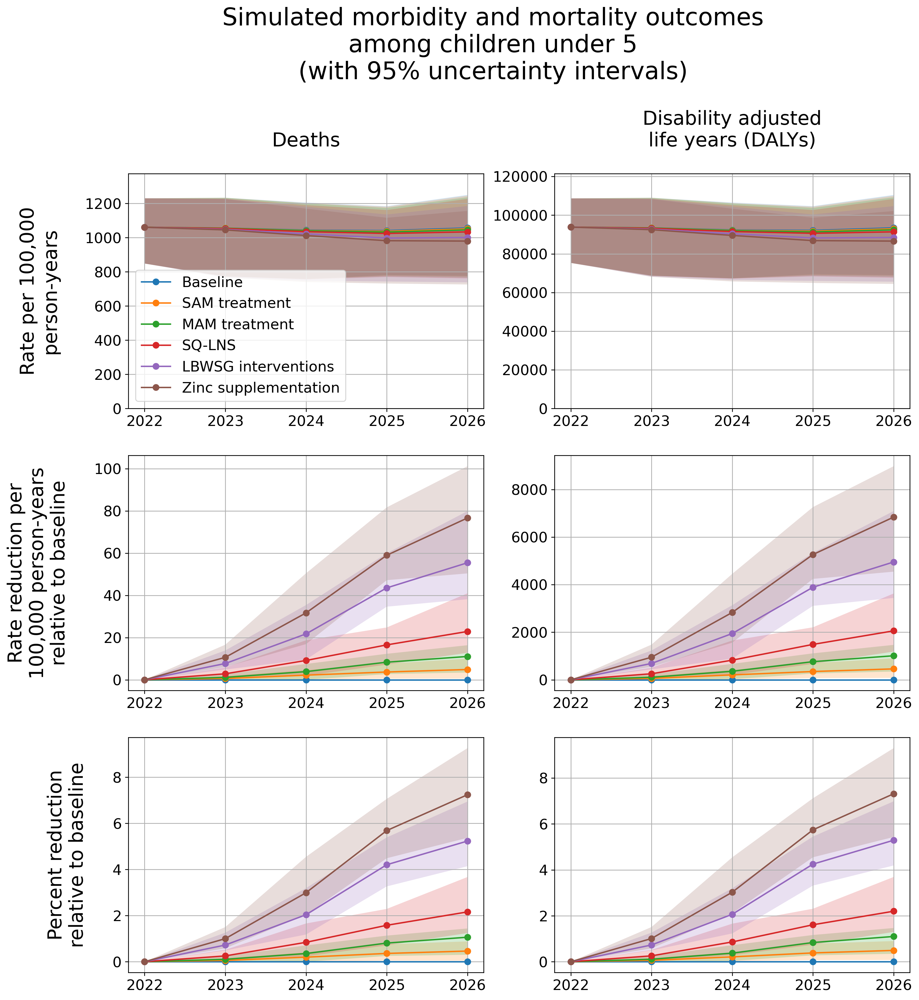

In [26]:
measures = ['deaths',
          'dalys',
          #'ylls',
         #'ylds'
           ]
measure_titles = ['Deaths\n',
                 'Disability adjusted\nlife years (DALYs)\n',
                 'Years of life\nlost (YLLs)\n',
                 'Years lived with\ndisability (YLDs)\n']

metrics = ['val','absolute_reduction','percent_reduction']
metric_titles = ['Rate per 100,000\nperson-years\n',
                 'Rate reduction per\n100,000 person-years\nrelative to baseline\n',
                 'Percent reduction\nrelative to baseline\n'
                ]

fig, axs = plt.subplots(len(metrics), 
                        len(measures),
                        dpi=250)
for metric in metrics:
    for measure in measures:
        data = calculate_mortality_u5_values(output_dir, ages, ['year'], metric, 
                             'baseline', measure)
        pos = axs[metrics.index(metric),measures.index(measure)]   
        for i in list(range(0,len(scenarios))):
            p_sub = data.loc[data.scenario==scenarios[i]]
            pos.plot(p_sub['year'], p_sub['value','mean'], marker='o', label=scenario_names[i])
            pos.fill_between(p_sub['year'], p_sub['value','2.5%'], p_sub['value','97.5%'], alpha=0.2)
        pos.grid()
        pos.set_xticks(p_sub.year.unique())
        pos.set_xticklabels(p_sub.year.unique(),fontsize=15)
        pos.tick_params(axis='y', labelsize=15)
        if metrics.index(metric)==0:
            pos.set_title(measure_titles[measures.index(measure)],size=20)
            pos.set_ylim(0,data.loc[data.scenario=='baseline']['value','97.5%'].max()*1.1)
            if measures.index(measure)==0:
                pos.legend(fontsize=15)
        if measures.index(measure)==0:
            pos.set_ylabel(metric_titles[metrics.index(metric)],size=20)
        #if metric=='percent_reduction':
        #    pos.set_ylim(-2,32)

plt.subplots_adjust(right=len(measures), top=len(metrics))
plt.suptitle('Simulated morbidity and mortality outcomes\namong children under 5\n(with 95% uncertainty intervals)',
             y=3.6,x=1,size=25)

# intervention coverage

Text(1, 1.25, 'SAM Treatment Intervention Parameters\n(with 95% confidence intervals)')

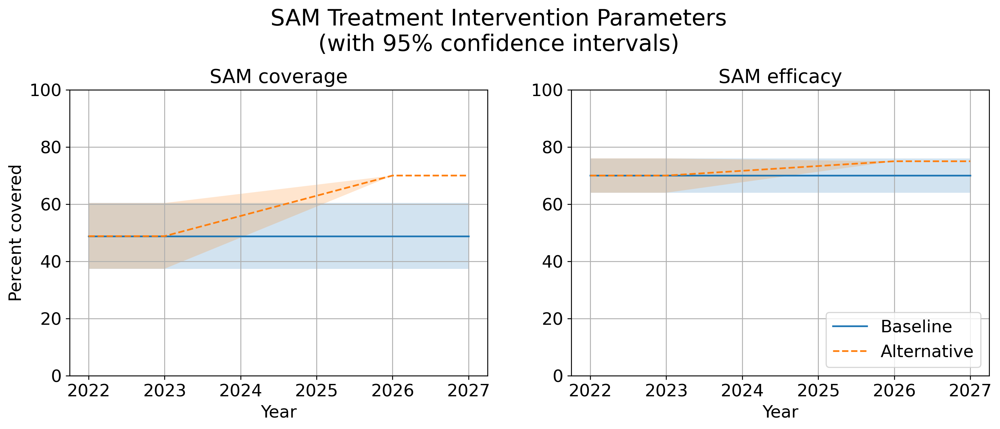

In [31]:
baseline_vals = [48.8, 70]
baseline_lcls = [37.4, 64]
baseline_ucls = [60.4, 76]
targets = [70, 75]
titles = [
         'SAM coverage',
         'SAM efficacy']
num1s = [0,0]
num2s = [0,1]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,2,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(0,100)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent covered',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)

plt.legend(fontsize=15,loc='lower right')#bbox_to_anchor=[1.5,2.2],)
plt.subplots_adjust(right=2, top=1)
plt.suptitle('SAM Treatment Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.25,x=1)

Text(1, 1.25, 'MAM Treatment Intervention Parameters\n(with 95% confidence intervals)')

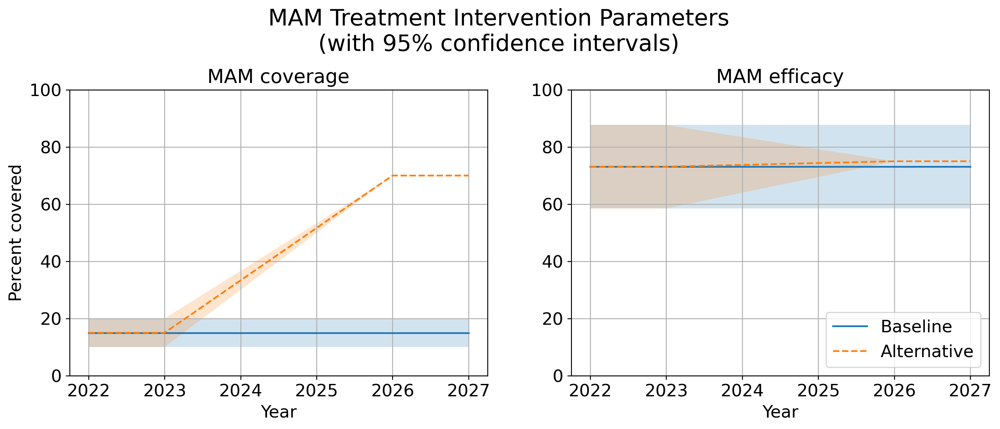

In [32]:
baseline_vals = [15, 73.1]
baseline_lcls = [10, 58.5]
baseline_ucls = [20, 87.7]
targets = [70, 75]
titles = [
         'MAM coverage',
         'MAM efficacy']
num1s = [0,0]
num2s = [0,1]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,2,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(0,100)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent covered',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)

plt.legend(fontsize=15,loc='lower right')#bbox_to_anchor=[1.5,2.2],)
plt.subplots_adjust(right=2, top=1)
plt.suptitle('MAM Treatment Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.25,x=1)

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

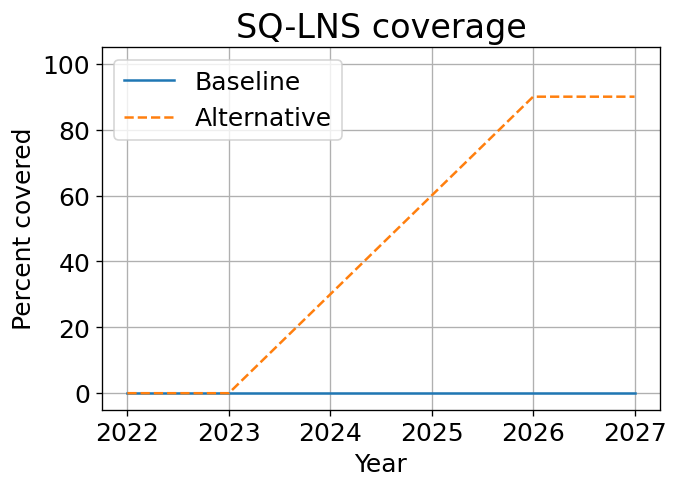

In [33]:
baseline_vals=[0]
baseline_ucls=[0]
baseline_lcls=[0]
targets=[90]
plt.figure(dpi=120)
for i in [0]:
    plt.plot(years,[baseline_vals[i]]*len(years),label='Baseline')
    plt.fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    plt.plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    plt.fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
plt.grid()
plt.ylim(-5,105)
plt.title('SQ-LNS coverage',size=20)
plt.legend(fontsize=15)
plt.ylabel('Percent covered',size=15)
plt.xlabel('Year',size=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

Text(1, 1.25, 'Zinc Supplementation Intervention Parameters\n(with 95% confidence intervals)')

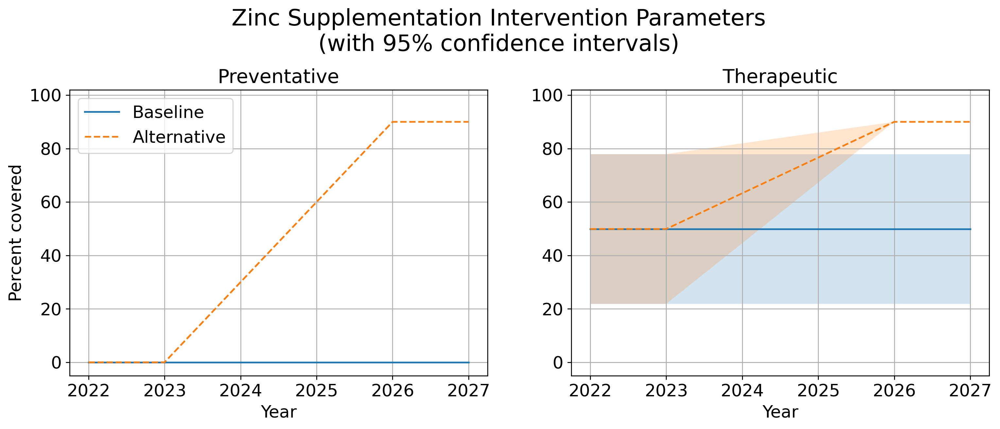

In [34]:
baseline_vals = [0, 49.9]
baseline_lcls = [0, 49.9-1.96*14.3]
baseline_ucls = [0, 49.9+1.96*14.3]
targets = [90, 90]
titles = [
         'Preventative',
         'Therapeutic']
num1s = [0,0]
num2s = [0,1]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,2,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(-5,102)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent covered',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)
axs[0].legend(fontsize=15,loc='upper left')


plt.subplots_adjust(right=2, top=1)
plt.suptitle('Zinc Supplementation Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.25,x=1)

Text(1.5, 1.35, 'ITNs During Pregnancy Intervention Parameters\n(with 95% confidence intervals)')

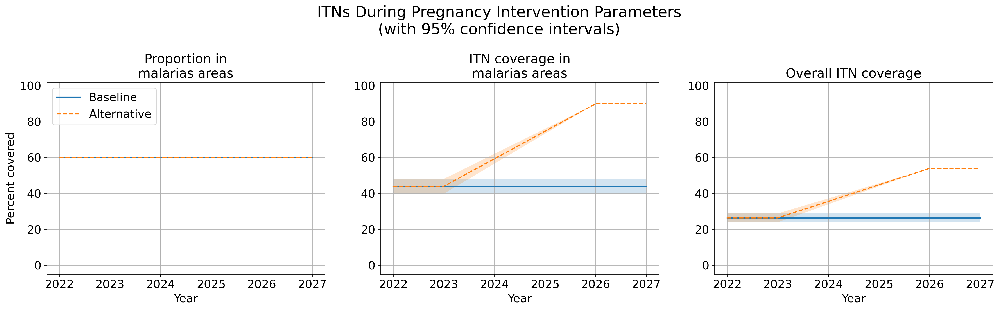

In [25]:
baseline_vals = [60, 44, 44*0.60]
baseline_lcls = [60, 44-1.96*2.1, (44-1.96*2.1)*0.6]
baseline_ucls = [60, 44+1.96*2.1, (44+1.96*2.1)*0.6]
targets = [60, 90, 90*0.6]
titles = [
         'Proportion in\nmalarias areas',
         'ITN coverage in\nmalarias areas',
    'Overall ITN coverage']
num1s = [0,0,1]
num2s = [0,1,2]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,3,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(-5,102)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent covered',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)
axs[0].legend(fontsize=15,loc='upper left')


plt.subplots_adjust(right=3, top=1)
plt.suptitle('ITNs During Pregnancy Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.35,x=1.5)

Text(1.5, 1.25, 'Supplementation During Pregnancy Intervention Parameters\n(with 95% confidence intervals)')

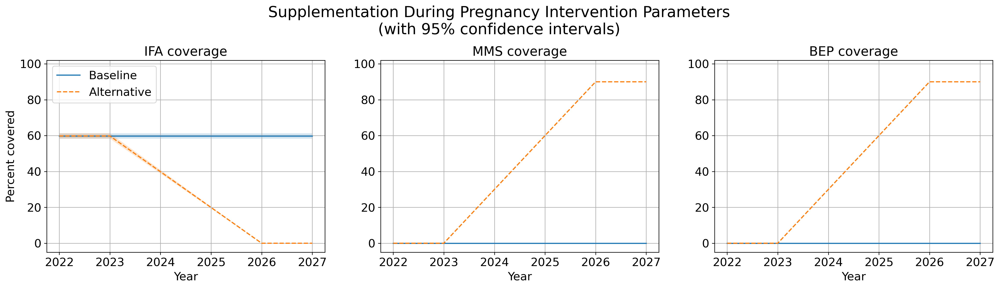

In [36]:
baseline_vals = [59.8, 0, 0]
baseline_lcls = [58.3, 0, 0]
baseline_ucls = [61.3, 0, 0]
targets = [0, 90, 90]
titles = [
         'IFA coverage',
         'MMS coverage',
    'BEP coverage']
num1s = [0,0,1]
num2s = [0,1,2]
labels=['Baseline','Alternative']

years = list(range(2022,2028))
fig, axs = plt.subplots(1,3,
                        dpi=250)

for i in list(range(0,len(baseline_vals))):

    axs[num2s[i]].plot(years,[baseline_vals[i]]*len(years), label='Baseline')
    axs[num2s[i]].fill_between(years, [baseline_lcls[i]]*len(years), [baseline_ucls[i]]*len(years),alpha=0.2)
    axs[num2s[i]].plot([2022,2023,2026,2027],[baseline_vals[i],
                                                       baseline_vals[i],
                                                       targets[i],
                                                       targets[i]], linestyle='dashed', label='Alternative')
    axs[num2s[i]].fill_between([2022,2023,2026,2027],[baseline_lcls[i],
                                                       baseline_lcls[i],
                                                       targets[i],
                                                       targets[i]],
                                        [baseline_ucls[i],
                                                       baseline_ucls[i],
                                                       targets[i],
                                                       targets[i]],alpha=0.2)
    axs[num2s[i]].grid()
    axs[num2s[i]].set_ylim(-5,102)
    axs[num2s[i]].set_title(titles[i],size=17)
    axs[0].set_ylabel('Percent covered',size=15)
    axs[num2s[i]].tick_params(axis='y', labelsize=15)
    axs[num2s[i]].tick_params(axis='x', labelsize=15)
    axs[num2s[i]].set_xlabel('Year',size=15)
axs[0].legend(fontsize=15,loc='upper left')


plt.subplots_adjust(right=3, top=1)
plt.suptitle('Supplementation During Pregnancy Intervention Parameters\n(with 95% confidence intervals)',
            fontsize=20,y=1.25,x=1.5)